In [2]:
import pandas as pd
from dataprep.clean import *
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from optuna import create_study, visualization
from optuna.pruners import SuccessiveHalvingPruner
from optuna.samplers import RandomSampler
import shap
import matplotlib.pyplot as plt

import machine_learning_pipeline as mlp
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Data Wrangling

#### Loading train and test dfs

In [3]:
dataset_folder = 'S3 E24 Binary Prediction of Smoker Status using Bio Signals'

train_df = pd.read_csv(f'{dataset_folder}/train.csv')
test_df = pd.read_csv(f'{dataset_folder}/test.csv')

# cleaning the headers
train_df = clean_headers(train_df)
# confirming the id is unique for each row and setting it 
# as the index
assert train_df.id.nunique() == len(train_df)
train_df = train_df.set_index('id')

test_df = clean_headers(test_df)
assert test_df.id.nunique() == len(test_df)
test_df = test_df.set_index('id')

train_df

Column Headers Cleaning Report:
	17 values cleaned (70.83%)
Column Headers Cleaning Report:
	17 values cleaned (73.91%)


,age,height_cm,weight_kg,waist_cm,eyesight_left,eyesight_right,hearing_left,hearing_right,systolic,relaxation,...,hdl,ldl,hemoglobin,urine_protein,serum_creatinine,ast,alt,gtp,dental_caries,smoking
id,,,,,,,,,,,,,,,,,,,,,
0,55,165,60,81.0,0.5,0.6,1,1,135,87,...,40,75,16.5,1,1.0,22,25,27,0,1
1,70,165,65,89.0,0.6,0.7,2,2,146,83,...,57,126,16.2,1,1.1,27,23,37,1,0
2,20,170,75,81.0,0.4,0.5,1,1,118,75,...,45,93,17.4,1,0.8,27,31,53,0,1
3,35,180,95,105.0,1.5,1.2,1,1,131,88,...,38,102,15.9,1,1.0,20,27,30,1,0
4,30,165,60,80.5,1.5,1.0,1,1,121,76,...,44,93,15.4,1,0.8,19,13,17,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159251,40,155,45,69.0,1.5,2.0,1,1,127,80,...,72,159,14.5,1,0.8,25,26,13,0,0
159252,50,155,75,82.0,1.0,1.0,1,1,120,80,...,64,108,14.5,1,0.6,21,20,18,0,0
159253,40,160,50,66.0,1.5,1.0,1,1,114,70,...,87,93,10.9,1,0.6,15,9,12,0,0


#### Handling the Target/Dependent Variable

In [4]:
# assigning a column of the dataframe as the tarfet
target = 'smoking'
# defining the type of our target: 'continuous', 'binary' or 'multiclass'
target_type = 'binary'

# checking that the target_type is a valid one
assert target_type in ['continuous', 'binary', 'multiclass']

# encoding the target for categorical string target columns
if target_type != 'continuous':
    le = LabelEncoder()
    train_df[target] = le.fit_transform(train_df[target].tolist())
    target_classes = list(le.classes_)
    print('Target Encoding:')
    for i, clss in enumerate(target_classes): print(target + ' ' + str(clss) + ' -> ' + target + ' ' + str(i)) 


Target Encoding:
smoking 0 -> smoking 0
smoking 1 -> smoking 1


#### Splitting features into numerical and categorical types

In [5]:
# creating a dataframe that lets us know the data types of each one of our 
# features
data_types = pd.DataFrame(train_df.dtypes, columns=['feature_type'])
data_types['unique_values'] = train_df.nunique()
data_types

,feature_type,unique_values
age,int64,18
height_cm,int64,14
weight_kg,int64,28
waist_cm,float64,531
eyesight_left,float64,20
eyesight_right,float64,17
hearing_left,int64,2
hearing_right,int64,2
systolic,int64,112
relaxation,int64,75


Although all the columns are numeric, the small number of diffetent values for some columns suggests that the they could be interpreted as categorical

In [6]:
# setting a threshold to determine categorical columns versus numerical
cat_threshold = 10
numerical_features, categorical_features = mlp.split_features(df=train_df, target_col=target, categorical_threshold=cat_threshold)

The numerical features are: ['waist_cm', 'eyesight_left', 'eyesight_right', 'hemoglobin', 'serum_creatinine', 'age', 'height_cm', 'weight_kg', 'systolic', 'relaxation', 'fasting_blood_sugar', 'cholesterol', 'triglyceride', 'hdl', 'ldl', 'ast', 'alt', 'gtp']
The categorical features are: ['hearing_left', 'hearing_right', 'urine_protein', 'dental_caries']


### EDA

#### Pairplot
These graphs help us visualize the relationships between our numerical features and the target. For numerical targets the last row of the pairplot corresponds to the target; for categorical targets, the target can be seen as the marker color in each graph.

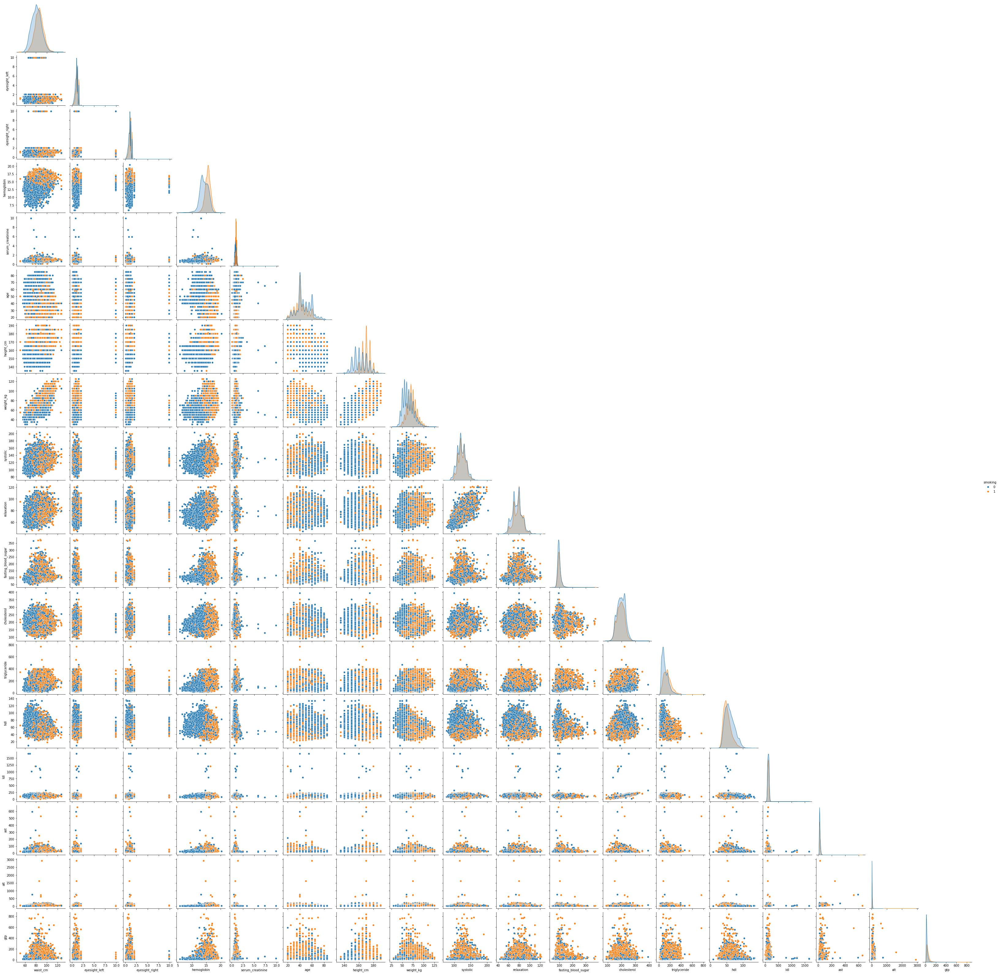

In [7]:
mlp.pairplot(df=train_df,
             numerical_features=numerical_features,
             target_type=target_type,
             target_col=target,
             sample=0.5)

#### Numerical Features Distribution Comparison
The graphs below are useful to identify any major differences between our train and test sets that can impact our models. It also shows the general distribution of each of the numerical features

In [81]:
# mlp.train_test_distribution_plots(train_df,
#                                   test_df,
#                                   numerical_features,
#                                   sample=0.5)

#### Categorical Features Distribution Comparison
The graphs below are useful to identify any major differences between our train and test sets that can impact our models. It also shows the general distribution of each of the cateorical features

In [9]:
mlp.train_test_categorical_piecharts(train_df,
                                     test_df,
                                     categorical_features)

#### Correlation Matrix

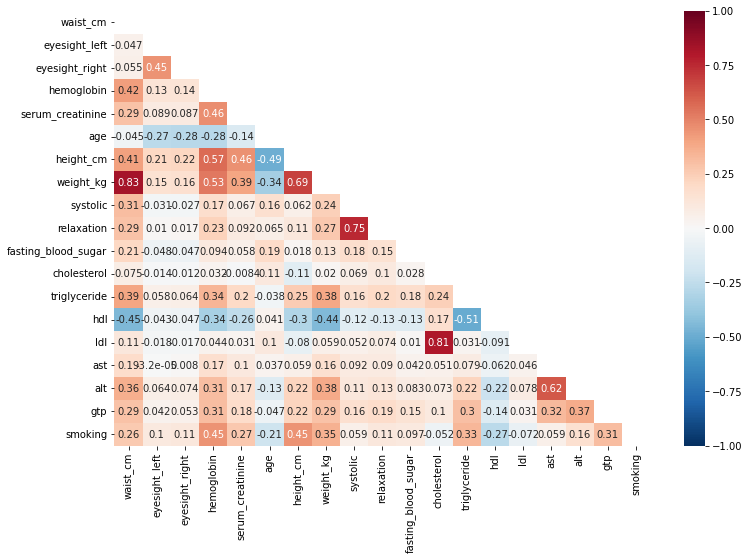

In [10]:
mlp.correlation_plot(train_df[numerical_features + [target]])

### Model Training with Optuna

#### Declaring variables needed for optimization step

In [11]:
# splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(train_df.drop(target, axis=1), 
                                                    train_df[target], 
                                                    test_size=0.2, 
                                                    random_state=42)

In [12]:
# During the model fitting step, the optuna optimizer will include the algorithm 
# as one of the  hyperparameters of the model. It will try to find the one that 
# performs the best for our problem.

if target_type == 'continuous':    
    optimization_objective = 'regression'
    # available algorithms for regression tasks. 
    algorithms = [
                    'linear', 
                    'ridge',
                    'histgb',                     
                    'extratrees', 
                    'lgb',
                    'xgb', 
                    'catboost'
                ] 
    
    # scoring for cross-validation
    optimization_scoring = 'r2'

elif target_type == 'binary':
    optimization_objective = 'classification'
    # available algorithms for binary classification tasks
    algorithms = [
                    'histgb',                     
                    'extratrees', 
                    'lgb',
                    'xgb', 
                    'catboost'
                ]
    # scoring for cross-validation
    optimization_scoring = 'roc_auc'

elif target_type == 'multiclass':
    optimization_objective = 'multiclass'
    # available algorithms for multiclass classification tasks
    algorithms = [
                    'histgb',                     
                    'lgb',
                ]
    # scoring for cross-validation
    optimization_scoring = 'neg_log_loss'

#### Model Optimization

In [54]:
%%time
# declaring our optuna study
factor = 2
# the pruner parameter helps make the optimization much faster as it will prune
# any iterations that don't look promising right from the start
study = create_study(study_name='optimization', 
                     direction='maximize',
                     pruner=SuccessiveHalvingPruner(reduction_factor=factor),
                     sampler=RandomSampler(seed=42))


# custom function to fit the model using smart hyperparameter search with optuna. This 
# parameter search is not restricted to the algorithm's hyperparameters. The algorithm
# itself is part of the parameters to be optimized. Data preprocessing decisions are 
# also included here, such as the scaling approach for numerical features, the encoding 
# technique for categorical variables, as well as feature selection.
study.optimize(lambda trial: mlp.objective(trial, 
                                           X_train, 
                                           y_train, 
                                           objective=optimization_objective,
                                           algorithms=algorithms,
                                           cv_scoring=optimization_scoring,
                                           numerical_columns=numerical_features, 
                                           categorical_columns=categorical_features,
                                           base=factor, 
                                           n_rungs=4), 
               n_trials=10)

[I 2024-04-14 19:47:01,708] A new study created in memory with name: optimization


[I 2024-04-14 19:47:12,953] Trial 0 finished with value: 0.860932593110315 and parameters: {'with_centering': False, 'with_scaling': True, 'categorical_encoder': 'sum', 'algorithm': 'lgb', 'lambda_l1': 1.6063676259174453e-08, 'lambda_l2': 50.01479828856935, 'num_leaves': 214, 'feature_fraction': 0.29110519961044856, 'bagging_fraction': 0.26364247048639056, 'bagging_freq': 2, 'min_child_samples': 34}. Best is trial 0 with value: 0.860932593110315.


[I 2024-04-14 19:47:19,461] Trial 1 finished with value: 0.8625020983670645 and parameters: {'with_centering': True, 'with_scaling': False, 'categorical_encoder': 'target', 'algorithm': 'lgb', 'lambda_l1': 0.0013878559259972313, 'lambda_l2': 0.008397416393796027, 'num_leaves': 13, 'feature_fraction': 0.6467903667112945, 'bagging_fraction': 0.2534717113185624, 'bagging_freq': 1, 'min_child_samples': 96}. Best is trial 1 with value: 0.8625020983670645.
[I 2024-04-14 19:47:19,677] Trial 2 pruned. 


[I 2024-04-14 19:47:19,923] Trial 3 pruned. 


[I 2024-04-14 19:47:20,221] Trial 4 pruned. 
[I 2024-04-14 19:47:20,408] Trial 5 pruned. 


[I 2024-04-14 19:47:33,646] Trial 6 finished with value: 0.8657038037794852 and parameters: {'with_centering': False, 'with_scaling': True, 'categorical_encoder': 'binary', 'algorithm': 'lgb', 'lambda_l1': 19.814199136703614, 'lambda_l2': 1.205601544392255, 'num_leaves': 163, 'feature_fraction': 0.884314531168946, 'bagging_fraction': 0.823304869209203, 'bagging_freq': 2, 'min_child_samples': 90}. Best is trial 6 with value: 0.8657038037794852.


[I 2024-04-14 19:47:33,938] Trial 7 pruned. 


[I 2024-04-14 19:47:35,052] Trial 8 pruned. 
[I 2024-04-14 19:47:35,278] Trial 9 pruned. 


Wall time: 33.6 s


In [55]:
# saving the models best parameters and trial and printing its best score
best_model_params = study.best_params
best_trial = study.best_trial
# printing the score of the best model
print(study.best_value)

0.8657038037794852


#### Optuna trials visualizations

In [56]:
visualization.plot_optimization_history(study)

In [57]:
visualization.plot_param_importances(study, target_name="ms")

#### Instantiating the model

In [58]:
# calling the best trial and instantiating the model
model = mlp.instantiate_model(best_trial, 
                              numerical_features, 
                              categorical_features, 
                              optimization_objective, 
                              algorithms)
model.fit(X_train, y_train)

Pipeline(steps=[('processor',
                 ColumnTransformer(transformers=[('numerical_pipeline',
                                                  Pipeline(steps=[('scaler',
                                                                   RobustScaler(with_centering=False))]),
                                                  ['waist_cm', 'eyesight_left',
                                                   'eyesight_right',
                                                   'hemoglobin',
                                                   'serum_creatinine', 'age',
                                                   'height_cm', 'weight_kg',
                                                   'systolic', 'relaxation',
                                                   'fasting_blood_sugar',
                                                   'cholesterol',
                                                   'triglyceride', 'hdl', 'ldl',
                                                   'ast', 'al...
                                                  Pipeline(steps=[('encoder',
                                                                   BinaryEncoder())]),
                                                  ['hearing_left',
                                                   'hearing_right',
                                                   'urine_protein',
                                                   'dental_caries'])])),
                ('model',
                 LGBMClassifier(bagging_fraction=0.823304869209203,
                                bagging_freq=2,
                                feature_fraction=0.884314531168946,
                                lambda_l1=19.814199136703614,
                                lambda_l2=1.205601544392255,
                                min_child_samples=90, num_leaves=163,
                                objective='binary', random_state=0,
                                verbosity=-1))])

In [59]:
# printing score on the test set
print(model.score(X_test,y_test))

0.7792917242245385


### Model Explainability with SHAP

In [60]:
best_model_params

{'with_centering': False,
 'with_scaling': True,
 'categorical_encoder': 'binary',
 'algorithm': 'lgb',
 'lambda_l1': 19.814199136703614,
 'lambda_l2': 1.205601544392255,
 'num_leaves': 163,
 'feature_fraction': 0.884314531168946,
 'bagging_fraction': 0.823304869209203,
 'bagging_freq': 2,
 'min_child_samples': 90}

#### Applying preprocessing steps to our dataset and Fitting the model
To be able to compute the shap values we need the preprocessed dataset and the chosen model. We'll use the best_model_params dictionary to retrieve them

In [76]:
from lightgbm import LGBMClassifier, LGBMRegressor
from sklearn.ensemble import RandomForestClassifier, ExtraTreesRegressor, HistGradientBoostingRegressor, AdaBoostRegressor
from sklearn.linear_model import LogisticRegression, LinearRegression
from category_encoders import OrdinalEncoder, OneHotEncoder, WOEEncoder, TargetEncoder, CatBoostEncoder, SumEncoder, BinaryEncoder, HelmertEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.compose import ColumnTransformer


# numerical_features_used = [col for col in numerical_features if best_model_params[col]]
numerical_features_used = numerical_features
# categorical_features_used = [col for col in categorical_features if best_model_params[col]]
categorical_features_used = categorical_features

X_train_preprocessed = X_train[numerical_features_used + categorical_features_used]
X_test_preprocessed = X_test[numerical_features_used + categorical_features_used]

valid_scaler_params = ['with_centering', 'with_scaling']
# Filter out non-preprocessing hyperparameters
preprocessing_params = {k: v for k, v in best_model_params.items() if k in valid_scaler_params}
final_scaler = RobustScaler(**preprocessing_params)

encoder_strategy = best_model_params['categorical_encoder']
if encoder_strategy == 'ordinal':
    encoder = OrdinalEncoder()
elif encoder_strategy == 'onehot':
    encoder = OneHotEncoder()
elif encoder_strategy == 'binary':
    encoder = BinaryEncoder()
elif encoder_strategy == 'helmert':
    encoder = HelmertEncoder()
elif encoder_strategy == 'sum':
    encoder = SumEncoder()
elif encoder_strategy == 'target':
    encoder = TargetEncoder()
elif encoder_strategy == 'woe':
    encoder = WOEEncoder()
elif encoder_strategy == 'catboost':
    encoder = CatBoostEncoder()
else:
    encoder = ''

final_processor = ColumnTransformer([
    ('scaler', final_scaler, numerical_features_used),
    ('encoder', encoder, categorical_features_used)
  ])

final_model_params = {k: v for k, v in best_model_params.items() if k not in (valid_scaler_params+['categorical_encoder'])}
del final_model_params['algorithm']
# for col in X_train.columns.to_list():
#     del final_model_params[col]
# final_model_params['objective'] = 'multiclass'
# final_model = HistGradientBoostingRegressor(**final_model_params)
final_model = LGBMClassifier(**final_model_params, verbosity=-1)
# final_model = LinearRegression(**final_model_params)

X_train_preprocessed = final_processor.fit_transform(X_train_preprocessed, y_train)
X_train_preprocessed = pd.DataFrame(X_train_preprocessed, columns=numerical_features + categorical_features, index=X_train.index)

X_test_preprocessed = final_processor.fit_transform(X_test_preprocessed, y_test)
X_test_preprocessed = pd.DataFrame(X_test_preprocessed, columns=numerical_features + categorical_features, index=X_test.index)


final_model.fit(X_train_preprocessed, y_train)

LGBMClassifier(bagging_fraction=0.823304869209203, bagging_freq=2,
               feature_fraction=0.884314531168946, lambda_l1=19.814199136703614,
               lambda_l2=1.205601544392255, min_child_samples=90,
               num_leaves=163, verbosity=-1)

#### Calculating Shap Values

In [62]:
explainer = shap.TreeExplainer(final_model)
# explainer = shap.Explainer(final_model, X_test_preprocessed)
shap_values = explainer.shap_values(X_train_preprocessed, y_train)

c:\Users\Dell\anaconda3\lib\site-packages\shap\explainers\_tree.py:386: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



In [63]:
# making sure the labels are correct
data_types = pd.DataFrame(X_train_preprocessed.dtypes, columns=['feature_type'])
data_types['unique_values'] = X_train_preprocessed.nunique()
data_types

,feature_type,unique_values
waist_cm,float64,527
eyesight_left,float64,18
eyesight_right,float64,17
hemoglobin,float64,132
serum_creatinine,float64,28
age,float64,18
height_cm,float64,14
weight_kg,float64,26
systolic,float64,110
relaxation,float64,75


#### Shap summary plot

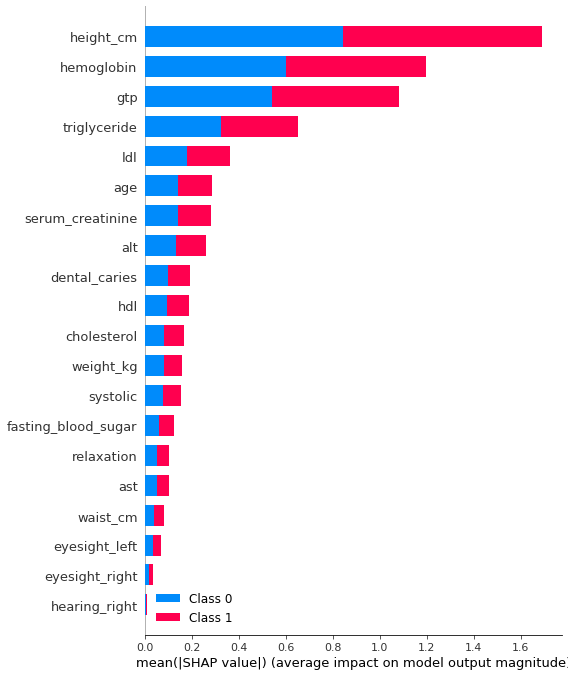

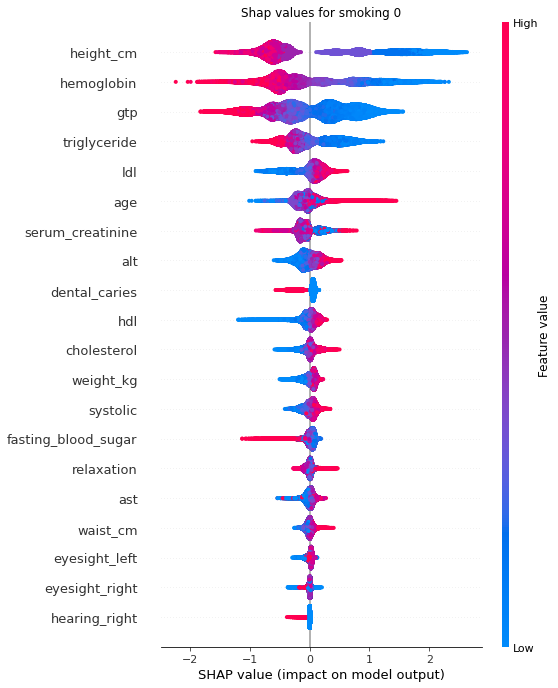

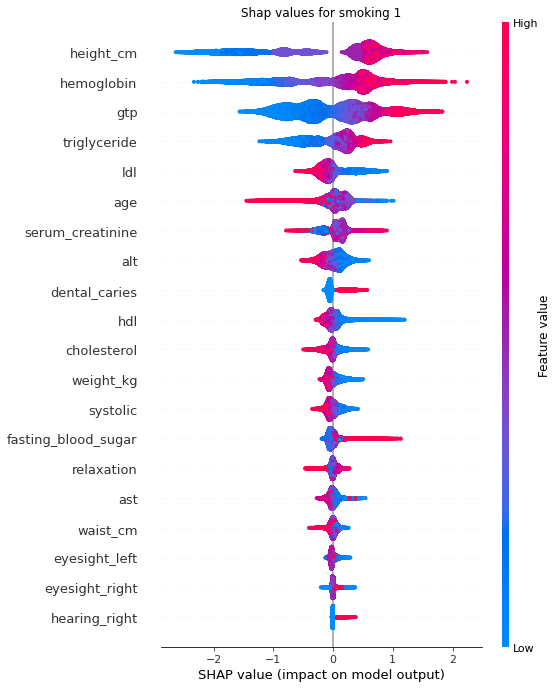

In [64]:
if target_type == 'continuous':     # graph not supported for multiclass
    shap.summary_plot(shap_values, 
                      X_train_preprocessed, 
                      feature_names=X_train_preprocessed.columns, 
                      plot_type='dot')
else:
    shap.summary_plot(shap_values, 
                      X_train_preprocessed, 
                      plot_type="bar", 
                      feature_names = X_train_preprocessed.columns)

    for i, tclass in enumerate(target_classes):
        shap.summary_plot(shap_values[i], 
                  X_train_preprocessed, 
                  plot_type="dot", 
                  feature_names = X_train_preprocessed.columns,
                  show=False) 
        plt.title(f'Shap values for {target} {tclass}')
        plt.show() 


#### Partial Dependence Plots

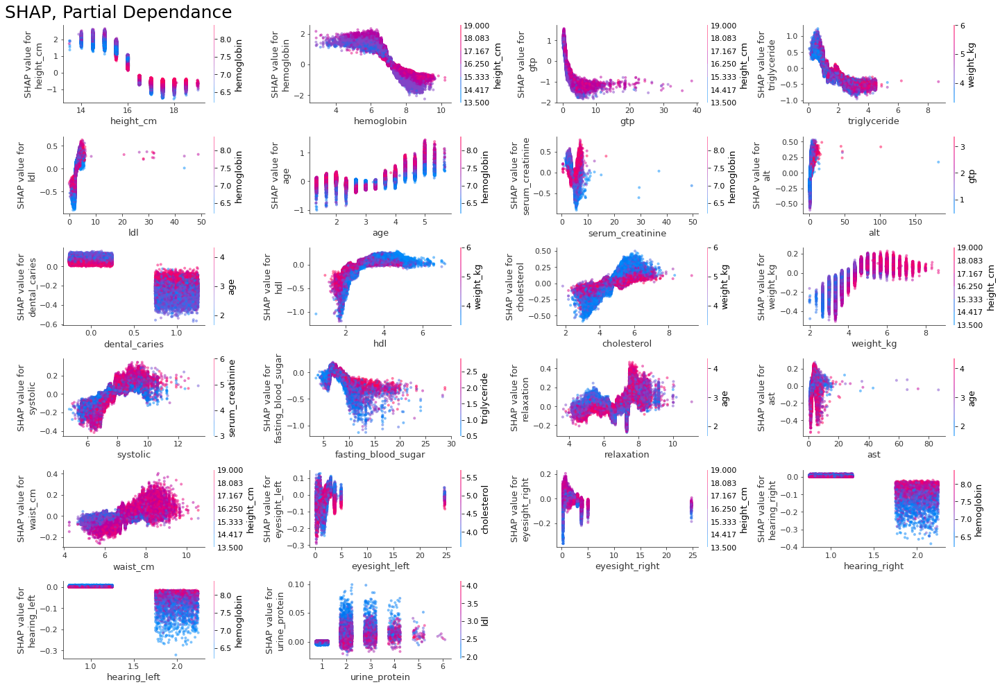

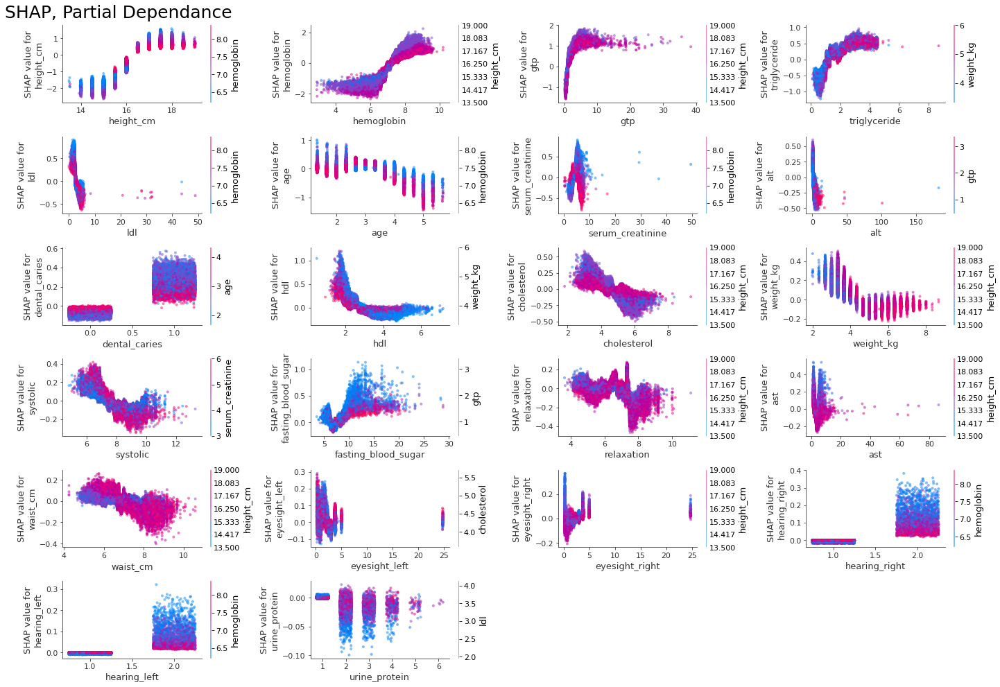

In [65]:
if target_type != 'continuous':
    # producing one graph for each class
    for i, tclass in enumerate(target_classes):
        mlp.shap_partial_dependence_plots(X_train_preprocessed, shap_values[i]) 
else:
    mlp.shap_partial_dependence_plots(X_train_preprocessed, shap_values)

Takeaways from the previous graphs: 

### Model Predictions Analysis

#### Train Set

In [66]:
if target_type == 'continuous':
    train_results = mlp.append_predictions(model=model, 
                                           df=X_train, 
                                           target_values=y_train,
                                           target_name=target,
                                           target_type=target_type, 
                                           df_preprocessed=X_train_preprocessed)
else:
    train_results = mlp.append_predictions(model=model, 
                                           df=X_train, 
                                           target_values=y_train,
                                           target_name=target,
                                           target_type=target_type, 
                                           df_preprocessed=X_train_preprocessed, 
                                           label_encoder=le)

train_results

,id,waist_cm,eyesight_left,eyesight_right,hemoglobin,serum_creatinine,age,height_cm,weight_kg,systolic,...,alt,gtp,hearing_left,hearing_right,urine_protein,dental_caries,pred_prob_0,pred_prob_1,smoking_prediction,smoking
0,60700,6.666667,1.25,1.25,5.90,3.0,2.666667,15.0,3.333333,7.5000,...,0.6875,0.346154,1.0,1.0,1.0,0.0,0.993324,0.006676,0,0
1,44065,5.750000,1.75,2.50,8.15,3.0,4.333333,15.0,3.333333,8.6875,...,1.5000,0.961538,1.0,1.0,1.0,0.0,0.702619,0.297381,0,0
2,39538,6.666667,3.00,3.00,6.70,3.0,3.666667,15.5,3.666667,6.8125,...,0.9375,0.615385,1.0,1.0,1.0,0.0,0.970559,0.029441,0,0
3,105427,6.916667,1.75,2.00,7.30,3.5,3.666667,16.0,4.000000,8.1250,...,0.8125,1.000000,1.0,1.0,1.0,0.0,0.911168,0.088832,0,0
4,148669,7.916667,2.50,3.00,6.90,4.5,2.000000,18.0,6.000000,7.5000,...,1.8750,0.807692,1.0,1.0,1.0,0.0,0.564691,0.435309,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127399,119879,7.333333,3.00,3.00,7.65,5.0,2.000000,18.0,5.333333,6.8750,...,5.4375,2.500000,1.0,1.0,1.0,0.0,0.403383,0.596617,1,1
127400,103694,6.583333,3.75,3.00,7.95,4.5,2.666667,16.5,4.333333,8.9375,...,1.6250,2.038462,1.0,1.0,1.0,1.0,0.116878,0.883122,1,1
127401,131932,6.750000,2.50,2.50,6.90,3.0,3.000000,16.0,4.000000,6.2500,...,0.8125,0.538462,1.0,1.0,1.0,0.0,0.940689,0.059311,0,1
127402,146867,8.083333,3.00,3.75,7.50,5.0,4.000000,17.0,5.666667,8.4375,...,3.3125,1.538462,1.0,1.0,1.0,0.0,0.826112,0.173888,0,0


##### Overall Observations vs. Predictions plot

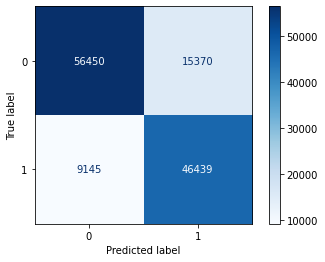

In [67]:
if target_type != 'continuous':
    mlp.confusion_matrix_plot(y_true=train_results[target],
                              y_pred=train_results[target + '_prediction'],
                              labels=target_classes)

In [68]:
import plotly.express as px

if target_type == 'continuous':
    hover_col = 'id'
    fig = px.scatter(train_results, 
                     x=target, 
                     y=f"{target}_prediction", 
                     hover_data=[hover_col],
                     width=600,
                     height=600)
    fig.show()
else:
    mlp.prediction_probability_distribution_plot(preds_df=train_results, 
                                                 target_classes=target_classes, 
                                                 target_colname=target)


##### Single prediction waterfall plot

In [69]:
shap_explainer_values_train = explainer(X_train_preprocessed, y_train)

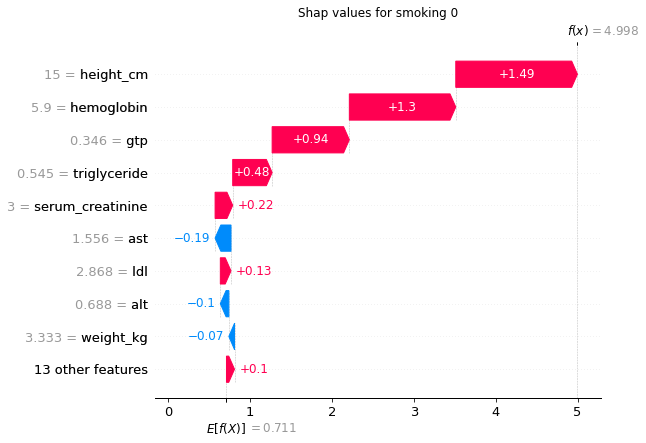

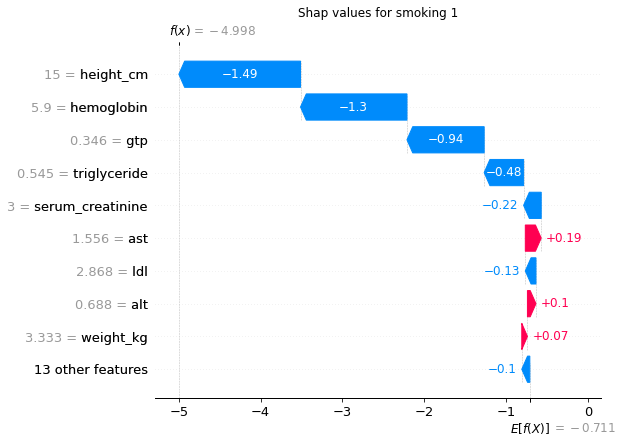

In [70]:
datapoint_id = 60700
idx = train_results[train_results.id == datapoint_id].index[0]
if target_type == 'continuous':
    shap.waterfall_plot(shap_explainer_values_train[idx])
else:
    for i, tclass in enumerate(target_classes):
        shap.waterfall_plot(shap_explainer_values_train[idx][:,i], show=False)
        plt.title(f'Shap values for {target} {tclass}')
        plt.show()

#### Test Set

In [71]:
if target_type == 'continuous':
    test_results = mlp.append_predictions(model=model, 
                                          df=X_test, 
                                          target_values=y_test,
                                          target_name=target,
                                          target_type=target_type, 
                                          df_preprocessed=X_test_preprocessed)
else:
    test_results = mlp.append_predictions(model=model, 
                                          df=X_test, 
                                          target_values=y_test,
                                          target_name=target,
                                          target_type=target_type, 
                                          df_preprocessed=X_test_preprocessed, 
                                          label_encoder=le)

test_results

,id,waist_cm,eyesight_left,eyesight_right,hemoglobin,serum_creatinine,age,height_cm,weight_kg,systolic,...,alt,gtp,hearing_left,hearing_right,urine_protein,dental_caries,pred_prob_0,pred_prob_1,smoking_prediction,smoking
0,145654,7.000000,2.00,2.50,8.00,3.5,2.333333,17.5,5.333333,7.6250,...,1.294118,1.230769,1.0,1.0,1.0,0.0,0.182726,0.817274,1,1
1,49118,7.333333,3.00,3.00,7.50,4.5,2.333333,18.5,5.333333,6.2500,...,1.294118,0.653846,1.0,1.0,1.0,0.0,0.307026,0.692974,1,1
2,21769,6.333333,3.00,3.00,8.45,4.0,1.333333,16.0,4.000000,8.1250,...,1.882353,1.576923,1.0,1.0,1.0,1.0,0.202845,0.797155,1,1
3,108299,7.316667,1.75,0.50,6.60,4.5,4.000000,15.5,4.000000,7.4375,...,0.941176,0.538462,1.0,1.0,1.0,0.0,0.990305,0.009695,0,0
4,117130,7.083333,2.00,1.50,7.75,3.5,4.000000,16.5,4.666667,8.8750,...,2.352941,2.346154,1.0,1.0,1.0,0.0,0.454173,0.545827,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31847,11934,6.366667,3.75,1.25,7.30,3.5,1.666667,16.5,4.000000,6.8750,...,1.882353,0.653846,1.0,1.0,1.0,0.0,0.643206,0.356794,0,1
31848,115975,6.916667,2.50,2.50,7.15,3.0,2.666667,15.5,4.333333,8.7500,...,1.529412,0.807692,1.0,1.0,1.0,0.0,0.971543,0.028457,0,0
31849,158289,7.000000,3.00,3.00,8.15,5.5,2.666667,17.5,4.666667,7.3125,...,1.529412,2.423077,1.0,1.0,1.0,0.0,0.149693,0.850307,1,1
31850,142308,5.000000,2.50,2.50,6.95,3.5,2.666667,17.0,3.333333,6.2500,...,0.647059,1.000000,1.0,1.0,1.0,0.0,0.243087,0.756913,1,0


##### Overall Observations vs. Predictions plot

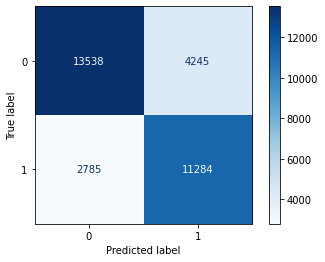

In [72]:
if target_type != 'continuous':
    mlp.confusion_matrix_plot(y_true=test_results[target],
                              y_pred=test_results[target + '_prediction'],
                              labels=target_classes)

In [73]:
if target_type == 'continuous':
    hover_col = 'id'
    fig = px.scatter(test_results, 
                     x=target, 
                     y=f"{target}_prediction", 
                     hover_data=[hover_col],
                     width=600,
                     height=600)
    fig.show()
else:
    mlp.prediction_probability_distribution_plot(preds_df=test_results, 
                                                 target_classes=target_classes, 
                                                 target_colname=target)


##### Single prediction waterfall plot

In [74]:
shap_explainer_values_test = explainer(X_test_preprocessed, y_test)

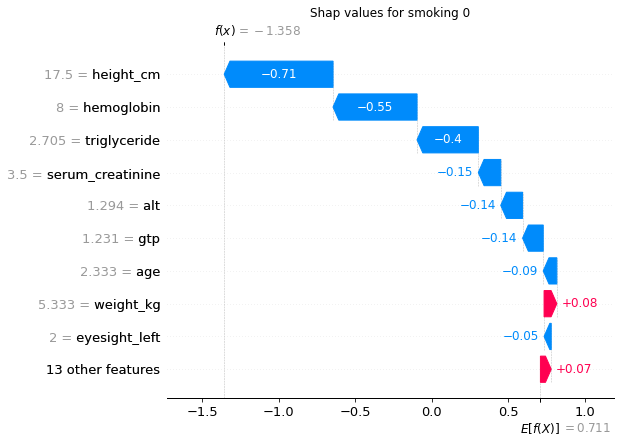

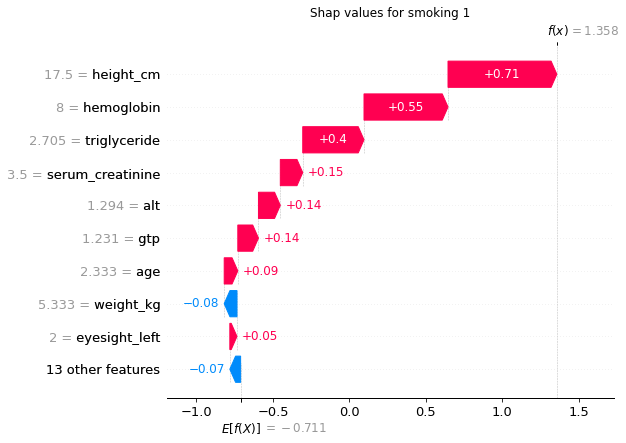

In [75]:
datapoint_id = 145654
idx = test_results[test_results.id == datapoint_id].index[0]
if target_type == 'continuous':
    shap.waterfall_plot(shap_explainer_values_test[idx])
else:
    for i, tclass in enumerate(target_classes):
        shap.waterfall_plot(shap_explainer_values_test[idx][:,i], show=False)
        plt.title(f'Shap values for {target} {tclass}')
        plt.show()

### Conclusion

In [ ]:
train_df_mod = train_df.copy()
train_df_mod['height_cm*hemoglobin'] = train_df_mod['height_cm']*train_df_mod['hemoglobin']
train_df_mod['height_cm*gtp'] = train_df_mod['height_cm']*train_df_mod['gtp']
train_df_mod['height_cm*triglyceride'] = train_df_mod['height_cm']*train_df_mod['triglyceride']
train_df_mod['age*hemoglobin'] = train_df_mod['age']*train_df_mod['hemoglobin']

X_train, X_test, y_train, y_test = train_test_split(train_df_mod.drop(target, axis=1), 
                                                    train_df_mod[target], 
                                                    test_size=0.2, 
                                                    random_state=42)

new_features = ['height_cm*hemoglobin', 'height_cm*gtp', 'height_cm*triglyceride', 'age*hemoglobin']